# Squats classification pose extraction with mediapipe

## Importing neccessary libraries

In [ ]:
import os
import cv2
import json
import random
from tqdm import tqdm
%pip install mediapipe
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose

from google.colab.patches import cv2_imshow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Get data from Google Drive

**Mount Drive**



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Testing**

In [ ]:
%cd /content/drive/Othercomputers/PFE/PFE 2023/data/Video_Dataset
%ls

/content/drive/Othercomputers/PFE/PFE 2023/data/Video_Dataset
bad_back_round/  bad_head/         bad_innner_thigh/  bad_toe/  Readme.md
bad_back_warp/   bad_inner_thigh/  bad_shallow/       good/


**Setup PATHS** 

## Data loading

In [ ]:
# Define Path to the Dataset folder
BASE_PATH = '/content/drive/Othercomputers/PFE/PFE 2023/data/Video_Dataset'
SUB_CLASSES = os.listdir(BASE_PATH)
SUB_CLASSES.remove('Readme.md')
print(SUB_CLASSES)

OUTPUT_PATH = "/content/drive/Othercomputers/PFE/PFE 2023/data/Keypoints_Dataset_V2"

['bad_shallow', 'bad_head', 'bad_innner_thigh', 'bad_inner_thigh', 'bad_toe', 'bad_back_round', 'good', 'bad_back_warp']


## 1.Data preprocessing

Function with showing the video and landmarks

In [ ]:
def detect_poses(video_path):
    cap = cv2.VideoCapture(video_path)
    # Create a dictionary to store the output
    output_dict = {}
    nb_frames = 0

    with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
        while cap.isOpened():
            frame_dict= {"frame": nb_frames}
            frame_landmarks = []
            ret, frame = cap.read()
            # If we can't read a frame, break out of the loop
            if not ret:
                break

            # Recolor image to RGB
            image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            image.flags.writeable = False

            # Make detection
            results = pose.process(image)

            # Recolor back to BGR
            image.flags.writeable = True
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

            # Extract landmarks
            try:
                landmarks = results.pose_landmarks.landmark
                #print(landmarks)
                for landmark in landmarks:
                    frame_landmarks.append([landmark.x,landmark.y,landmark.z,landmark.visibility])
            except:
                pass
            image = cv2.resize(image, (0, 0), fx=0.4, fy=0.4)  # change the size to fit your needs

            # Render detections
            mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                                    mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=2),
                                    mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                                     )

            cv2_imshow(image)

            if cv2.waitKey(10) & 0xFF == ord('q'):
                break
            frame_dict["landmarks"]=frame_landmarks
            output_dict[str(nb_frames)]=frame_dict
            nb_frames+=1

        cap.release()
        cv2.destroyAllWindows()
        # Define the output file name
        output_filename = f"{video_path.split('.')[0]}.json"
        #print(output_filename)
        # Write the output to the JSON file
        with open(output_filename, 'w') as output_file:
            json.dump(output_dict, output_file)


Function without showing the landmarks

In [ ]:
def detect_poses_without_showing(video_path, output_dir):
    # Create output directory if it does not exist
    os.makedirs(output_dir, exist_ok=True)

    cap = cv2.VideoCapture(video_path)
    # Create a dictionary to store the output
    output_list = []
    nb_frames = 0

    with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
        while True:
            frame_dict = {"frame": nb_frames}
            frame_landmarks = []
            ret, frame = cap.read()
            # If we can't read a frame, break out of the loop
            if not ret:
                break

            # Recolor image to RGB
            image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Make detection
            results = pose.process(image)

            # Extract landmarks
            try:
                landmarks = results.pose_landmarks.landmark
                for landmark in landmarks:
                    frame_landmarks.append([landmark.x,landmark.y,landmark.z,landmark.visibility])
            except:
                pass

            frame_dict["landmarks"] = frame_landmarks
            output_list.append(frame_dict)
            nb_frames += 1

        cap.release()
        # Define the output file name
        output_filename = os.path.join(output_dir, f"{os.path.splitext(os.path.basename(video_path))[0]}.json")
        # Write the output to the JSON file
        with open(output_filename, 'w') as output_file:
            json.dump(output_list, output_file)


Processing bad_shallow:   0%|          | 0/292 [00:00<?, ?videos/s]

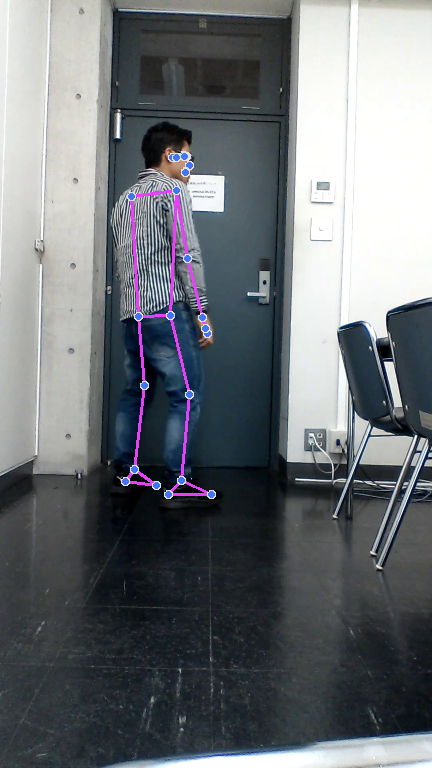

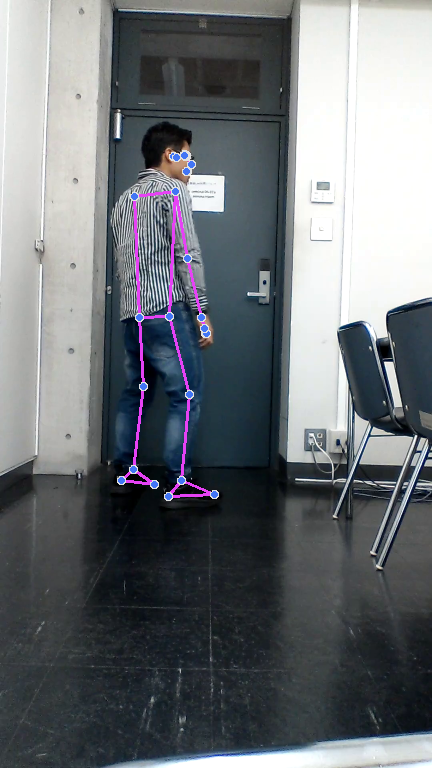

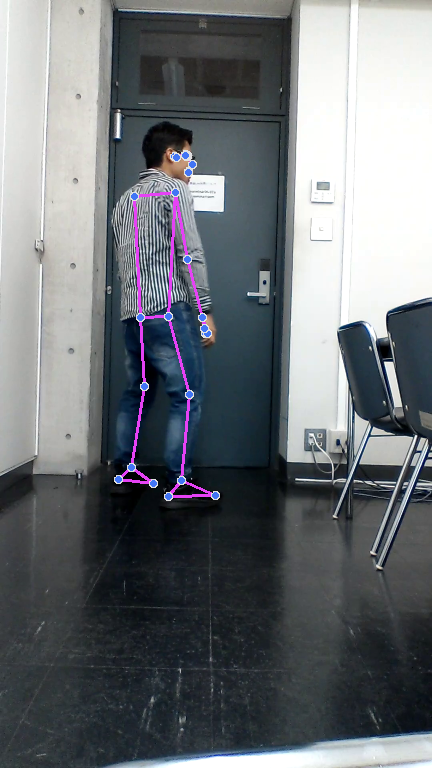

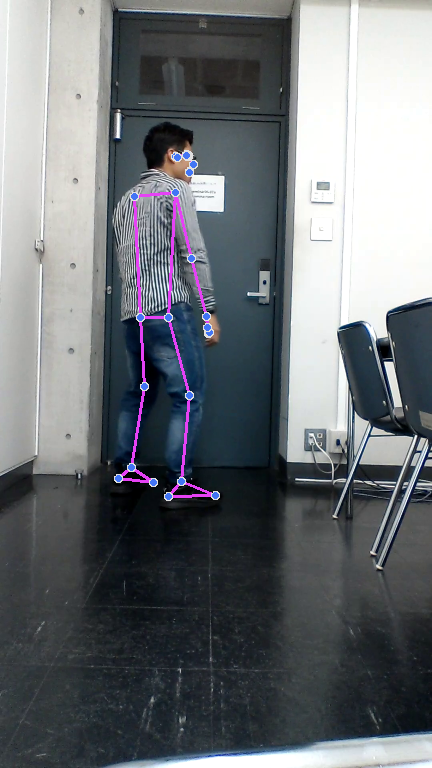

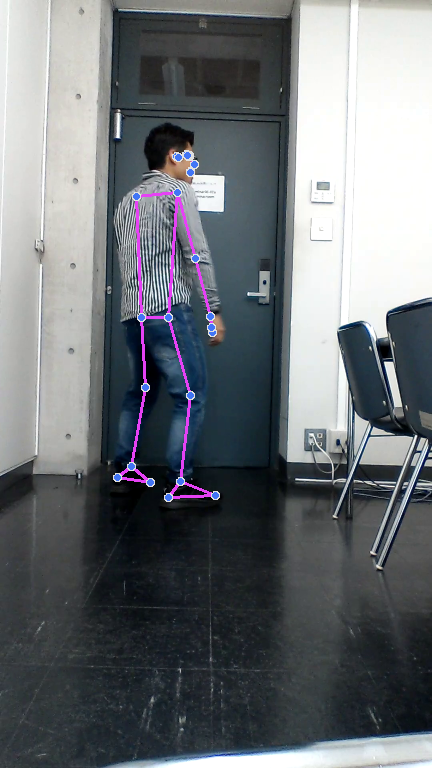

...

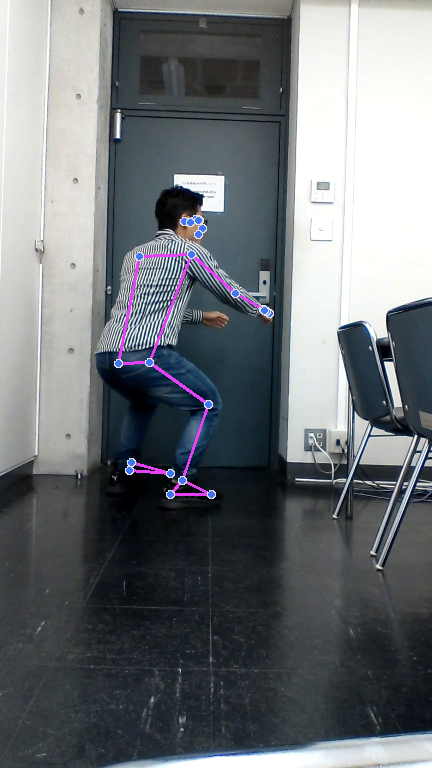

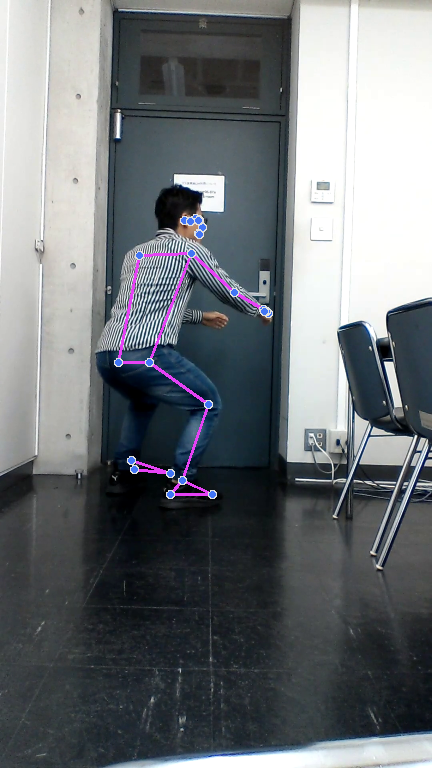

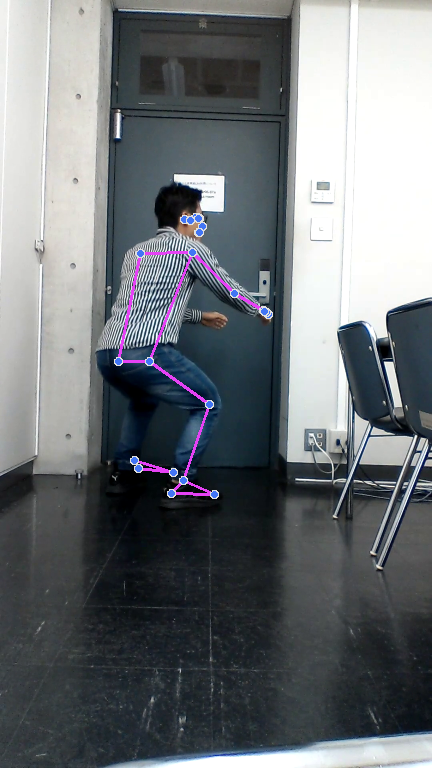

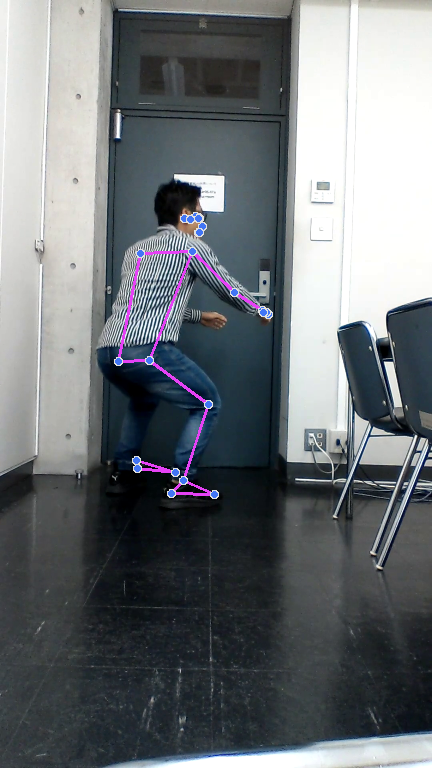

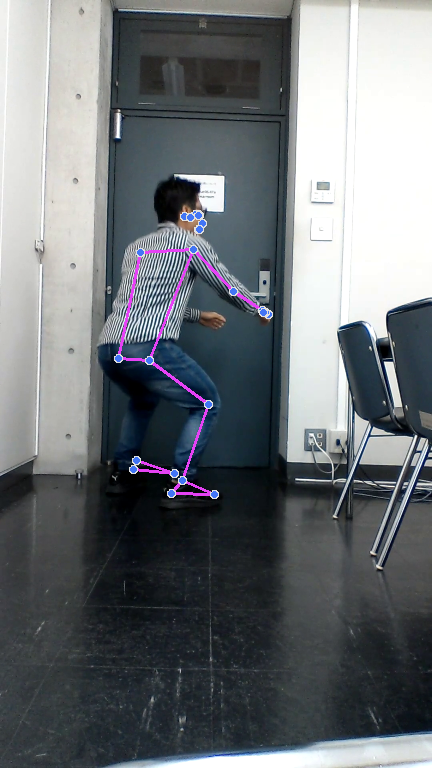

In [ ]:
for folder_name in SUB_CLASSES:
    folder = os.path.join(BASE_PATH, folder_name)
    if not os.path.isdir(folder):
        continue

    for video_file in tqdm(os.listdir(folder), desc=f"Processing {folder_name}", unit="videos"):
        if not video_file.endswith(".mp4"):
            continue

        video_path = os.path.join(folder, video_file)
        output_dir = os.path.join(OUTPUT_PATH, folder_name)
        os.makedirs(output_dir, exist_ok=True)
        #detect_poses_without_showing(video_path, output_dir)
        detect_poses(video_path)
